In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

In [2]:
validation_set = tf.keras.utils.image_dataset_from_directory(
    '../Data/valid',
    labels="inferred",
    label_mode="categorical",
    class_names=None,
    color_mode="rgb",
    batch_size=32,
    image_size=(128, 128),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False
)
class_name = validation_set.class_names
print(class_name)

Found 17572 files belonging to 38 classes.
['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Tw

In [3]:
model_test = tf.keras.models.load_model('../models/trained_plant_disease_model.keras')

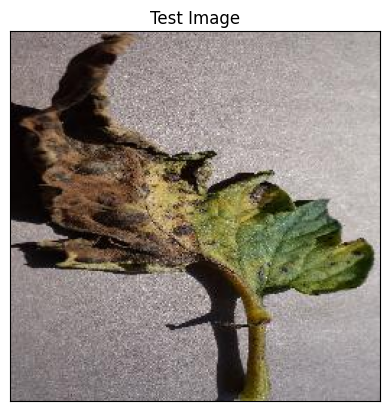

In [4]:
#Test Image Visualization
import cv2
image_path = '../Data/test/test/TomatoEarlyBlight1.JPG'
# Reading an image in default mode
img = cv2.imread(image_path)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB) #Converting BGR to RGB
# Displaying the image 
plt.imshow(img)
plt.title('Test Image')
plt.xticks([])
plt.yticks([])
plt.show()

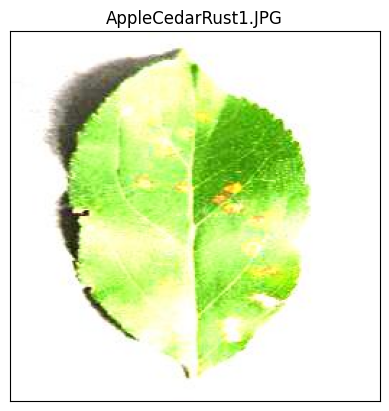

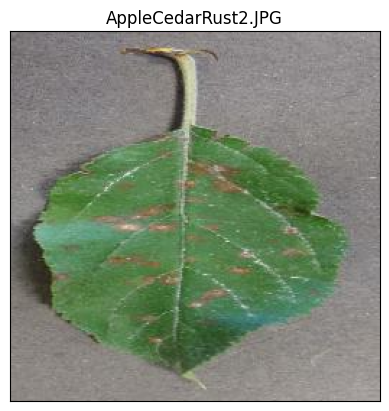

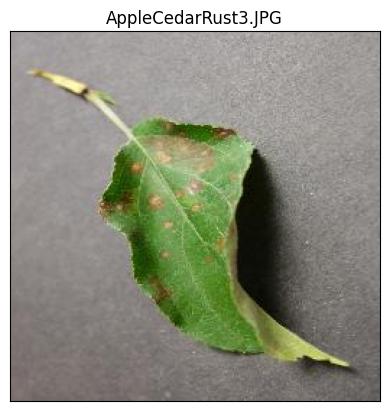

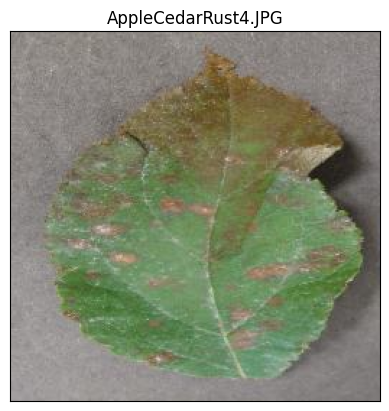

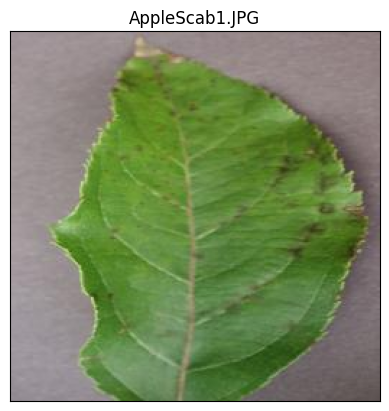

...

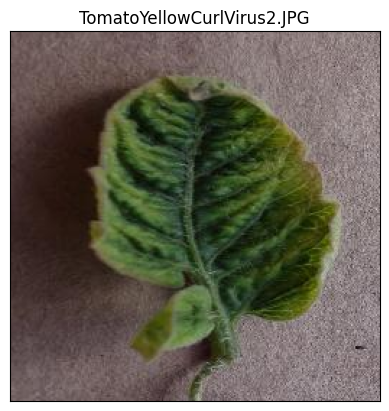

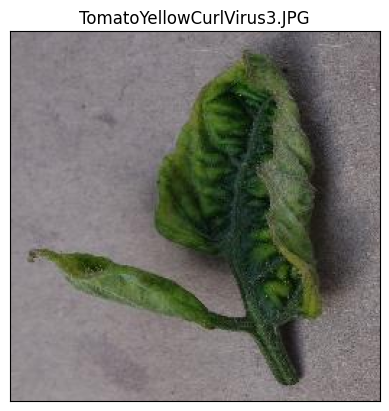

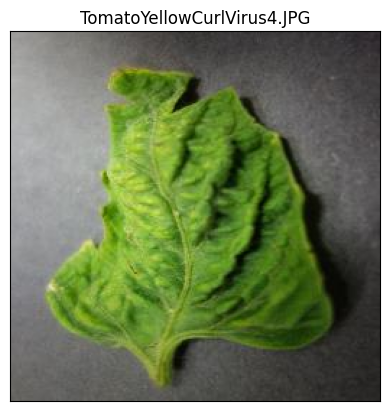

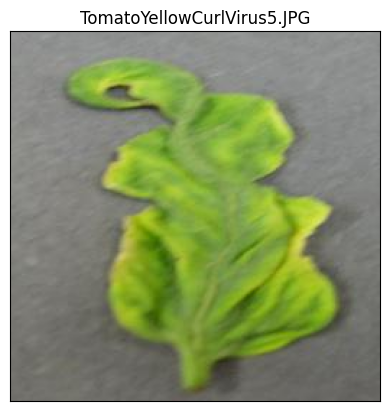

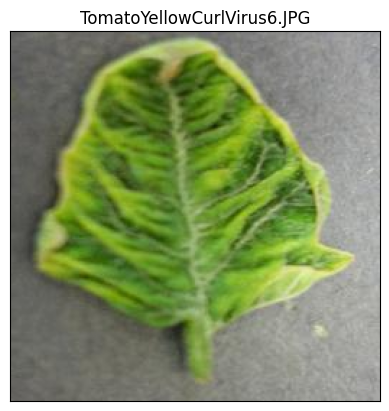

In [5]:
import cv2
import os 
import matplotlib.pyplot as plt

folder_path = "../Data/test/test/"

image_files = [f for f in os.listdir(folder_path) if f.endswith(('JPG', 'JPEG', 'PNG', 'BMP'))]

# Loop through all image files
for image_file in image_files:
    image_path = os.path.join(folder_path, image_file)
    
    # Read the image
    img = cv2.imread(image_path)
    
    if img is not None:  # Check if the image was read correctly
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        
        # Display the image
        plt.imshow(img)
        plt.title(image_file)
        plt.xticks([])
        plt.yticks([])
        plt.show()
    else:
        print(f"Failed to read {image_file}")

In [15]:
import tensorflow as tf
import os
import numpy as np

# Define the folder path
folder_path = '../Data/test/test/'

# Get all image files in the directory
image_files = [f for f in os.listdir(folder_path) if f.endswith(('JPG', 'JPEG', 'PNG', 'BMP'))]

# Initialize a list to store predictions
all_predictions = []

# Loop through all image files
for image_file in image_files:
    image_path = os.path.join(folder_path, image_file)
    
    # Load and preprocess the image
    image = tf.keras.preprocessing.image.load_img(image_path, target_size=(128, 128))  # Resize image
    input_arr = tf.keras.preprocessing.image.img_to_array(image)  # Convert image to array
    input_arr = np.array([input_arr])  # Convert single image to a batch
    
    # Make predictions
    predictions = model_test.predict(input_arr)
    
    # Get the result index (the class with the highest probability)
    result_index = np.argmax(predictions)
    result_probability = predictions[0][result_index]  # Get the probability of the predicted class
    
    # Append the result to the list
    all_predictions.append((image_file, result_index, result_probability))
    
    # Print the result for the current image
    print(f"Image: {image_file}, Predicted Class Index: {result_index}, Probability: {result_probability:.4f}")

# Optionally, print all results after processing all images
print(f"\nAll Predictions: {all_predictions}")
# for pred in all_predictions:
#     print(f"Image: {pred[0]}, Predicted Class Index: {pred[1]}, Probability: {pred[2]:.4f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Image: AppleCedarRust1.JPG, Predicted Class Index: 2, Probability: 0.9871
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Image: AppleCedarRust2.JPG, Predicted Class Index: 2, Probability: 0.4520
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Image: AppleCedarRust3.JPG, Predicted Class Index: 2, Probability: 0.8353
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Image: AppleCedarRust4.JPG, Predicted Class Index: 2, Probability: 0.9689
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Image: AppleScab1.JPG, Predicted Class Index: 0, Probability: 0.8618
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Image: AppleScab2.JPG, Predicted Class Index: 0, Probability: 0.9997
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Image: AppleScab3.JPG, Predicted Class Index: 20, Probability: 0.9786
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Image: CornCommonRust1.JPG, Predicted Class Index: 8, Probability: 0.9998
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Image: CornCommonRust2.JPG, Predicted Class Index: 8, Probability: 1.0000
1/1 ━━

In [7]:
image = tf.keras.preprocessing.image.load_img(image_path,target_size=(128,128))
input_arr = tf.keras.preprocessing.image.img_to_array(image)
input_arr = np.array([input_arr])  # Convert single image to a batch.
predictions = model_test.predict(input_arr)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


In [8]:
print(predictions)

[[1.52755702e-19 3.07803599e-20 1.26699163e-14 3.98616914e-17
  2.42486425e-17 3.37730400e-14 3.65181758e-19 1.21143521e-17
  3.79028503e-19 1.63558823e-19 3.05074065e-20 7.78727668e-13
  1.16204450e-15 2.20064657e-12 1.51832145e-17 9.65285777e-15
  1.74120245e-17 1.31367871e-22 2.99809168e-13 4.04922195e-16
  4.46215826e-22 8.70781882e-18 5.56450142e-16 7.15837389e-11
  9.96508004e-16 1.53048892e-14 1.10966843e-15 1.35470109e-16
  2.07728768e-09 2.17018379e-13 5.28874137e-16 1.08832113e-16
  7.19331190e-16 1.64997584e-12 8.96448660e-13 1.00000000e+00
  3.83542753e-14 3.01852629e-19]]


In [9]:
result_index = np.argmax(predictions) #Return index of max element
print(result_index)

35


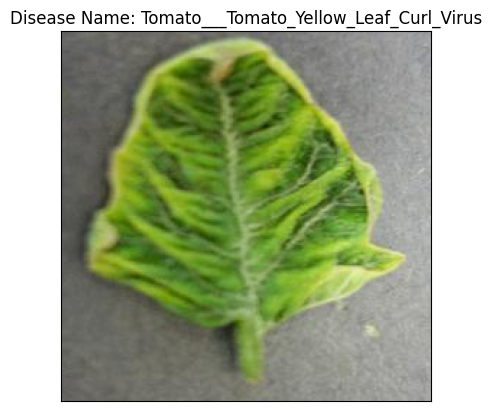

In [10]:
# Displaying the disease prediction
model_prediction = class_name[result_index]
plt.imshow(img)
plt.title(f"Disease Name: {model_prediction}")
plt.xticks([])
plt.yticks([])
plt.show()